In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer


In [4]:
df = pd.read_csv("RegresiUTSTelkom.csv")
df.head()

,2001,49.94357,21.47114,73.0775,8.74861,-17.40628,-13.09905,-25.01202,-12.23257,7.83089,...,13.0162,-54.40548,58.99367,15.37344,1.11144,-23.08793,68.40795,-1.82223,-27.46348,2.26327
0,2001,48.73215,18.42930,70.32679,12.94636,-10.32437,-24.83777,8.76630,-0.92019,18.76548,...,5.66812,-19.68073,33.04964,42.87836,-9.90378,-32.22788,70.49388,12.04941,58.43453,26.92061
1,2001,50.95714,31.85602,55.81851,13.41693,-6.57898,-18.54940,-3.27872,-2.35035,16.07017,...,3.03800,26.05866,-50.92779,10.93792,-0.07568,43.20130,-115.00698,-0.05859,39.67068,-0.66345
2,2001,48.24750,-1.89837,36.29772,2.58776,0.97170,-26.21683,5.05097,-10.34124,3.55005,...,34.57337,-171.70734,-16.96705,-46.67617,-12.51516,82.58061,-72.08993,9.90558,199.62971,18.85382
3,2001,50.97020,42.20998,67.09964,8.46791,-15.85279,-16.81409,-12.48207,-9.37636,12.63699,...,9.92661,-55.95724,64.92712,-17.72522,-1.49237,-7.50035,51.76631,7.88713,55.66926,28.74903
4,2001,50.54767,0.31568,92.35066,22.38696,-25.51870,-19.04928,20.67345,-5.19943,3.63566,...,6.59753,-50.69577,26.02574,18.94430,-0.33730,6.09352,35.18381,5.00283,-11.02257,0.02263


In [5]:
# Rename columns to "tahun", "x1", "x2", ..., "x90"
df.columns = ["Tahun"] + [f"X{i}" for i in range(1, 91)]
df.head()

,Tahun,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X81,X82,X83,X84,X85,X86,X87,X88,X89,X90
0,2001,48.73215,18.42930,70.32679,12.94636,-10.32437,-24.83777,8.76630,-0.92019,18.76548,...,5.66812,-19.68073,33.04964,42.87836,-9.90378,-32.22788,70.49388,12.04941,58.43453,26.92061
1,2001,50.95714,31.85602,55.81851,13.41693,-6.57898,-18.54940,-3.27872,-2.35035,16.07017,...,3.03800,26.05866,-50.92779,10.93792,-0.07568,43.20130,-115.00698,-0.05859,39.67068,-0.66345
2,2001,48.24750,-1.89837,36.29772,2.58776,0.97170,-26.21683,5.05097,-10.34124,3.55005,...,34.57337,-171.70734,-16.96705,-46.67617,-12.51516,82.58061,-72.08993,9.90558,199.62971,18.85382
3,2001,50.97020,42.20998,67.09964,8.46791,-15.85279,-16.81409,-12.48207,-9.37636,12.63699,...,9.92661,-55.95724,64.92712,-17.72522,-1.49237,-7.50035,51.76631,7.88713,55.66926,28.74903
4,2001,50.54767,0.31568,92.35066,22.38696,-25.51870,-19.04928,20.67345,-5.19943,3.63566,...,6.59753,-50.69577,26.02574,18.94430,-0.33730,6.09352,35.18381,5.00283,-11.02257,0.02263


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515344 entries, 0 to 515343
Data columns (total 91 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Tahun   515344 non-null  int64  
 1   X1      515344 non-null  float64
 2   X2      515344 non-null  float64
 3   X3      515344 non-null  float64
 4   X4      515344 non-null  float64
 5   X5      515344 non-null  float64
 6   X6      515344 non-null  float64
 7   X7      515344 non-null  float64
 8   X8      515344 non-null  float64
 9   X9      515344 non-null  float64
 10  X10     515344 non-null  float64
 11  X11     515344 non-null  float64
 12  X12     515344 non-null  float64
 13  X13     515344 non-null  float64
 14  X14     515344 non-null  float64
 15  X15     515344 non-null  float64
 16  X16     515344 non-null  float64
 17  X17     515344 non-null  float64
 18  X18     515344 non-null  float64
 19  X19     515344 non-null  float64
 20  X20     515344 non-null  float64
 21  X21     51

In [7]:
# Sampling data (contoh: 1% dari total data)
sampled_df = df.sample(frac=0.1, random_state=42)

# Menampilkan informasi dataset setelah sampling
print(f"Jumlah data setelah sampling: {len(sampled_df)}")
print(sampled_df.info())

Jumlah data setelah sampling: 51534
<class 'pandas.core.frame.DataFrame'>
Index: 51534 entries, 201297 to 102108
Data columns (total 91 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Tahun   51534 non-null  int64  
 1   X1      51534 non-null  float64
 2   X2      51534 non-null  float64
 3   X3      51534 non-null  float64
 4   X4      51534 non-null  float64
 5   X5      51534 non-null  float64
 6   X6      51534 non-null  float64
 7   X7      51534 non-null  float64
 8   X8      51534 non-null  float64
 9   X9      51534 non-null  float64
 10  X10     51534 non-null  float64
 11  X11     51534 non-null  float64
 12  X12     51534 non-null  float64
 13  X13     51534 non-null  float64
 14  X14     51534 non-null  float64
 15  X15     51534 non-null  float64
 16  X16     51534 non-null  float64
 17  X17     51534 non-null  float64
 18  X18     51534 non-null  float64
 19  X19     51534 non-null  float64
 20  X20     51534 non-null  float64
 21

## EDA

In [8]:
# Statistik deskriptif
print(sampled_df.describe())

              Tahun            X1            X2            X3            X4  \
count  51534.000000  51534.000000  51534.000000  51534.000000  51534.000000   
mean    1998.463286     43.381234      1.116871      8.630126      1.153814   
std       10.841441      6.096472     51.990030     35.316084     16.230094   
min     1922.000000      4.836880   -305.422000   -245.390230   -119.573670   
25%     1994.000000     39.941252    -26.215203    -11.522355     -8.466527   
50%     2002.000000     44.264790      8.598380     10.463270     -0.654040   
75%     2006.000000     47.866132     36.043190     29.765515      8.748738   
max     2010.000000     61.138540    303.977370    322.851430    122.987250   

                 X5            X6            X7            X8            X9  \
count  51534.000000  51534.000000  51534.000000  51534.000000  51534.000000   
mean      -6.456766     -9.471798     -2.367160     -1.767880      3.650041   
std       22.919380     12.826267     14.556213    

In [9]:
# Cek missing values
print(sampled_df.isnull().sum())

Tahun    0
X1       0
X2       0
X3       0
X4       0
        ..
X86      0
X87      0
X88      0
X89      0
X90      0
Length: 91, dtype: int64


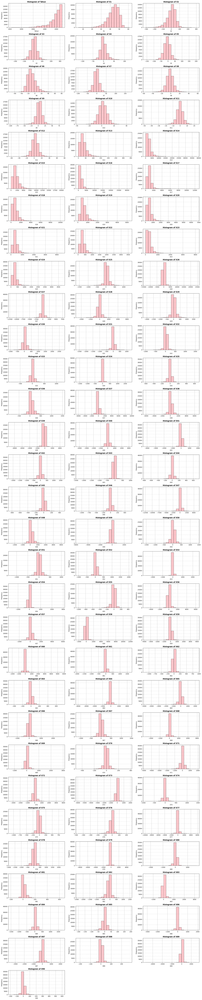

In [10]:
# Menentukan jumlah kolom dan baris
n_features = sampled_df.shape[1]
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

# Membuat subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 100))  # Ukuran diperbesar
axes = axes.flatten()

# Plot histogram untuk setiap fitur
for i, col in enumerate(sampled_df.columns):
    sampled_df[col].hist(ax=axes[i], bins=20, alpha=0.75, color='#FFB3BA', edgecolor='black')
    axes[i].set_title(f'Histogram of {col}', fontsize=12, fontweight='bold')
    axes[i].set_xlabel(col, fontsize=10)
    axes[i].set_ylabel('Frequency', fontsize=10)
    axes[i].grid(axis='y', linestyle='--', alpha=0.7)

# Menyembunyikan subplot kosong (jika ada)
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Menyempurnakan tata letak
plt.tight_layout()
plt.subplots_adjust(top=0.98)  # Memberikan margin tambahan di atas
plt.show()

In [11]:
# Menghitung matriks korelasi
correlation_matrix = sampled_df.corr()

# Menghitung korelasi absolut antar fitur
correlation_abs = correlation_matrix.abs()

# Menjumlahkan korelasi absolut untuk setiap fitur
correlation_sums = correlation_matrix.abs().sum().sort_values(ascending=False)

# Menampilkan fitur dengan korelasi tertinggi terhadap yang lain
print("Fitur dengan korelasi total tertinggi terhadap fitur lain:")
print(correlation_sums)

# Memilih target terbaik
best_target = correlation_sums.index[1]  # Index 0 adalah 'Tahun' atau target asli
print(f"Fitur terbaik untuk dijadikan target: {best_target}")

Fitur dengan korelasi total tertinggi terhadap fitur lain:
X16      20.796226
X23      20.369078
X18      19.563088
X20      18.517183
X22      18.337466
           ...    
X89       6.200842
X74       6.189592
X12       5.804907
Tahun     5.606775
X87       5.208901
Length: 91, dtype: float64
Fitur terbaik untuk dijadikan target: X23


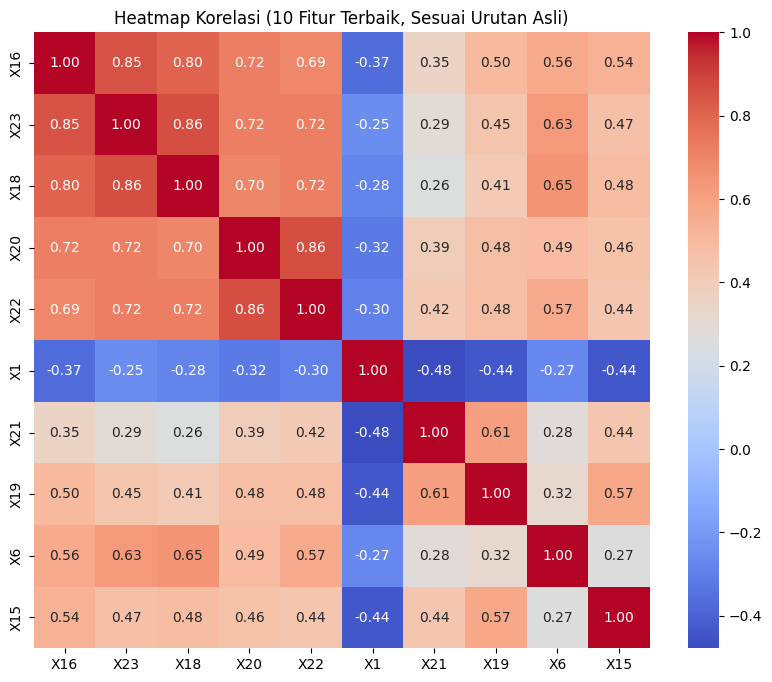

In [12]:
# Memilih 10 fitur terbaik berdasarkan korelasi tertinggi
top_10_features = correlation_sums.index[:10]

# Membuat subset matriks korelasi untuk fitur-fitur tersebut
top_10_corr_matrix = correlation_matrix.loc[top_10_features, top_10_features]

# Membuat heatmap
plt.figure(figsize=(10, 8))
# Use top_10_corr_matrix instead of sorted_corr_matrix
sns.heatmap(top_10_corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", square=True)
plt.title("Heatmap Korelasi (10 Fitur Terbaik, Sesuai Urutan Asli)")
plt.show()

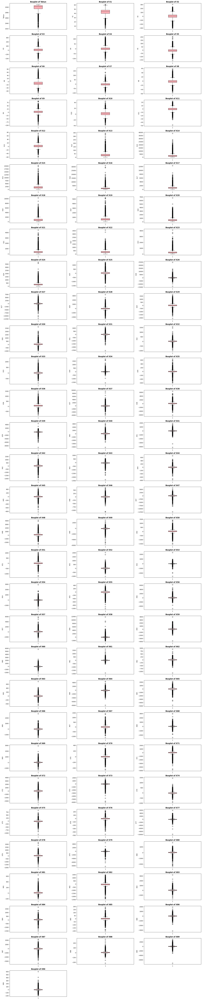

In [13]:
# Menentukan jumlah kolom dan baris
n_features = sampled_df.shape[1]
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

# Membuat subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 100))  # Ukuran diperbesar
axes = axes.flatten()

# Plot boxplot untuk setiap fitur
for i, col in enumerate(sampled_df.columns):
    axes[i].boxplot(sampled_df[col], patch_artist=True, boxprops=dict(facecolor='#FFB3BA', color='black'),
                    medianprops=dict(color='black'), whiskerprops=dict(color='black'), capprops=dict(color='black'))
    axes[i].set_title(f'Boxplot of {col}', fontsize=12, fontweight='bold')
    axes[i].set_ylabel(col, fontsize=10)

# Menyembunyikan subplot kosong (jika ada)
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Menyempurnakan tata letak
plt.tight_layout()
plt.subplots_adjust(top=0.98)  # Memberikan margin tambahan di atas
plt.show()


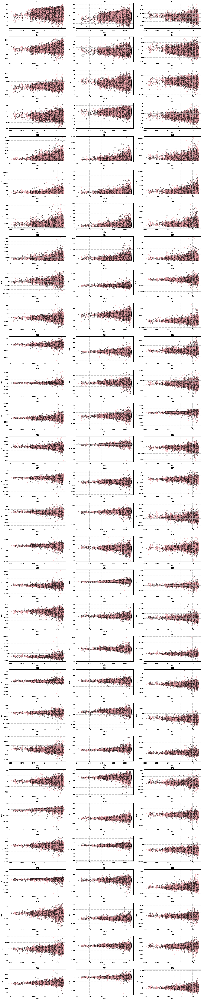

In [14]:
# Menentukan jumlah kolom dan baris
n_features = sampled_df.shape[1] - 1  # Fitur selain kolom pertama
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

# Membuat subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 100))  # Ukuran diperbesar
axes = axes.flatten()

# Plot scatterplot untuk setiap fitur dibandingkan dengan kolom pertama
for i, col in enumerate(sampled_df.columns[1:]):  # Mulai dari kolom kedua
    axes[i].scatter(sampled_df['Tahun'], sampled_df[col], alpha=0.6, color='#FFB3BA', edgecolor='black')
    axes[i].set_title(f'{col}', fontsize=12, fontweight='bold')
    axes[i].set_xlabel('Tahun', fontsize=10)
    axes[i].set_ylabel(col, fontsize=10)
    axes[i].grid(alpha=0.7, linestyle='--')

# Menyembunyikan subplot kosong (jika ada)
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Menyempurnakan tata letak
plt.tight_layout()
plt.subplots_adjust(top=0.98)  # Memberikan margin tambahan di atas
plt.show()


## PIPELINE

In [15]:
# Memisahkan fitur dan target
X = sampled_df.drop(columns=['Tahun'])
y = sampled_df['Tahun']

# Membagi dataset menjadi training dan testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [16]:
# Pipeline untuk Polynomial Regression
poly_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),  # Add an Imputer step
    ('poly_features', PolynomialFeatures(degree=2, include_bias=False)),
    ('scaler', StandardScaler()),
    ('regressor', DecisionTreeRegressor(random_state=42))
])

# Training dan evaluasi
poly_pipeline.fit(X_train, y_train)
y_pred_poly = poly_pipeline.predict(X_test)

print("Polynomial Regression Results:")
print("MSE:", mean_squared_error(y_test, y_pred_poly))
print("R2 Score:", r2_score(y_test, y_pred_poly))

Polynomial Regression Results:
MSE: 189.54943242456582
R2 Score: -0.6384769501643688


In [17]:
# Pipeline untuk Decision Tree Regression
dt_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', DecisionTreeRegressor(random_state=42, max_depth=10))
])

# Training dan evaluasi
dt_pipeline.fit(X_train, y_train)
y_pred_dt = dt_pipeline.predict(X_test)

print("Decision Tree Regression Results:")
print("MSE:", mean_squared_error(y_test, y_pred_dt))
print("R2 Score:", r2_score(y_test, y_pred_dt))


Decision Tree Regression Results:
MSE: 113.43825474621066
R2 Score: 0.01943275012174861


In [18]:
# Pipeline untuk XGBoost Regression
xgb_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', XGBRegressor(objective='reg:squarederror', random_state=42))
])

# Training dan evaluasi
xgb_pipeline.fit(X_train, y_train)
y_pred_xgb = xgb_pipeline.predict(X_test)

print("XGBoost Regression Results:")
print("MSE:", mean_squared_error(y_test, y_pred_xgb))
print("R2 Score:", r2_score(y_test, y_pred_xgb))


XGBoost Regression Results:
MSE: 86.50281784705658
R2 Score: 0.2522643208503723


## HYPERPARAMETER TUNING

In [19]:
from sklearn.model_selection import GridSearchCV

# --- Hyperparameter Tuning untuk Decision Tree Regression ---
dt_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', DecisionTreeRegressor(random_state=42))
])

# Hyperparameter grid untuk DecisionTreeRegressor
param_grid_dt = {
    'regressor__max_depth': [5, 10, 15, None],
    'regressor__min_samples_split': [2, 5, 10],
    'regressor__min_samples_leaf': [1, 2, 4]
}

grid_search_dt = GridSearchCV(dt_pipeline, param_grid_dt, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
grid_search_dt.fit(X_train, y_train)
best_dt_model = grid_search_dt.best_estimator_

# Prediksi dan evaluasi model terbaik
y_pred_dt = best_dt_model.predict(X_test)
print("Decision Tree Regression (Tuning) Results:")
print("Best Parameters:", grid_search_dt.best_params_)
print("MSE:", mean_squared_error(y_test, y_pred_dt))
print("R2 Score:", r2_score(y_test, y_pred_dt))

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Decision Tree Regression (Tuning) Results:
Best Parameters: {'regressor__max_depth': 5, 'regressor__min_samples_leaf': 4, 'regressor__min_samples_split': 10}
MSE: 99.95353835354904
R2 Score: 0.13599546785857175


In [20]:
# --- Hyperparameter Tuning untuk XGBoost Regression ---
xgb_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', XGBRegressor(objective='reg:squarederror', random_state=42))
])

# Hyperparameter grid untuk XGBRegressor
param_grid_xgb = {
    'regressor__max_depth': [3, 5, 7],
    'regressor__learning_rate': [0.01, 0.05, 0.1],
    'regressor__n_estimators': [50, 100, 200],
    'regressor__subsample': [0.8, 1.0]
}

grid_search_xgb = GridSearchCV(xgb_pipeline, param_grid_xgb, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
grid_search_xgb.fit(X_train, y_train)
best_xgb_model = grid_search_xgb.best_estimator_

# Prediksi dan evaluasi model terbaik
y_pred_xgb = best_xgb_model.predict(X_test)
print("XGBoost Regression (Tuning) Results:")
print("Best Parameters:", grid_search_xgb.best_params_)
print("MSE:", mean_squared_error(y_test, y_pred_xgb))
print("R2 Score:", r2_score(y_test, y_pred_xgb))

Fitting 5 folds for each of 54 candidates, totalling 270 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


XGBoost Regression (Tuning) Results:
Best Parameters: {'regressor__learning_rate': 0.05, 'regressor__max_depth': 7, 'regressor__n_estimators': 200, 'regressor__subsample': 0.8}
MSE: 80.24166173329088
R2 Score: 0.30638617277145386


In [23]:
# Hyperparameter grid
param_grid_poly = {
    'poly_features__degree': [2],  # Degree polinomial
    'regressor__max_depth': [5, 10],  # Kedalaman maksimum untuk DecisionTreeRegressor
    'regressor__min_samples_split': [2, 5]  # Minimum sampel untuk split
}

# Grid Search CV untuk mencari parameter terbaik
grid_search_poly = GridSearchCV(
    poly_pipeline,
    param_grid_poly,
    cv=3,
    scoring='neg_mean_squared_error',
    n_jobs=1,  # Gunakan 1 core untuk menghindari konflik memori
    verbose=2
)

# Training model
grid_search_poly.fit(X_train, y_train)

# Model terbaik
best_poly_model = grid_search_poly.best_estimator_

# Prediksi dengan model terbaik
y_pred_poly = best_poly_model.predict(X_test)

# --- Evaluasi ---
# Menghitung metrik evaluasi
mse = mean_squared_error(y_test, y_pred_poly)
r2 = r2_score(y_test, y_pred_poly)

# Menampilkan hasil
print("=" * 50)
print("Polynomial Regression (Tuning) Results:")
print(f"Best Parameters: {grid_search_poly.best_params_}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"R² Score (R2): {r2:.4f}")
print("=" * 50)


Fitting 3 folds for each of 4 candidates, totalling 12 fits
[CV] END poly_features__degree=2, regressor__max_depth=5, regressor__min_samples_split=2; total time= 1.9min
[CV] END poly_features__degree=2, regressor__max_depth=5, regressor__min_samples_split=2; total time= 1.9min
[CV] END poly_features__degree=2, regressor__max_depth=5, regressor__min_samples_split=2; total time= 1.9min
[CV] END poly_features__degree=2, regressor__max_depth=5, regressor__min_samples_split=5; total time= 1.9min
[CV] END poly_features__degree=2, regressor__max_depth=5, regressor__min_samples_split=5; total time= 1.9min
[CV] END poly_features__degree=2, regressor__max_depth=5, regressor__min_samples_split=5; total time= 2.0min
[CV] END poly_features__degree=2, regressor__max_depth=10, regressor__min_samples_split=2; total time= 3.5min
[CV] END poly_features__degree=2, regressor__max_depth=10, regressor__min_samples_split=2; total time= 3.4min
[CV] END poly_features__degree=2, regressor__max_depth=10, regress